# Projeto 2 - Diabetic_Data - https://www.kaggle.com/datasets/brandao/diabetes?resource=download
# Adriana R M de Souza
# Luiz Gabriel de Souza
# Pablo Ernesto Vigneaux Wilton

### Exploratory Data Analysis - EDA 
#### *Impact of HbA1c Measurement on Hospital Readmission Rates:*
#### *Analysis of 70,000 Clinical Database Patient Records*

Informações:
Os dados do Health Facts que usamos foram um extrato representando
10 anos (1999–2008) de cuidados clínicos em 130 hospitais e
redes de entrega integradas em todos os Estados Unidos:
Centro-Oeste (18 hospitais), Nordeste (58), Sul (28) e Oeste
(16). A maioria dos hospitais (78) tem leitos entre 100 e
499, 38 hospitais têm leitos menores que 100 e leitos de
14 hospitais é maior que 500.

Explicação Básica:

É importante saber se um paciente será readmitido em algum hospital. A razão é que você pode mudar o tratamento, a fim de evitar uma readmissão.

Neste banco de dados, você tem 3 saídas diferentes:

Sem readmissão;
Uma readmissão em menos de 30 dias (esta situação não é boa, porque talvez o seu tratamento não tenha sido adequado);
Uma readmissão em mais de 30 dias (esta não é tão boa quanto a última, porém, o motivo pode ser o estado do paciente.
Nesse contexto, você pode ver diferentes funções objetivo para o problema. Você pode tentar descobrir situações em que o paciente não será readmitido, ou se será readmitido em menos de 30 dias (porque o problema pode atrapalhar o tratamento), etc... Faça sua escolha e vamos ajudá-los a criar novas abordagens para o problema.

Informações sobre o nosso país: [fonte](https://materiais.prorim.org.br/ebook-descobrindo-o-diabetes?gclid=CjwKCAjwy_aUBhACEiwA2IHHQHJNqYTCQ5SVsujMmZ0fEE79xzEGjS3cDIfoj2bgkb-qUIiPqUPztxoC9KQQAvD_BwE)

"O Brasil tem cerca de 15 milhões de pessoas diabéticas. O país está entre os cinco primeiros da América do Sul e Central com os maiores índices de diabéticos entre 20 e 79 anos."

Tipos de diabetes: [fonte](https://diabetes.org.br/)
Tipo 1 - entre 5 e 10% com a doença
Tipo 2 - 90% têm o tipo 2
Gestacional
Pré-diabéticos - obesos/hipertensos

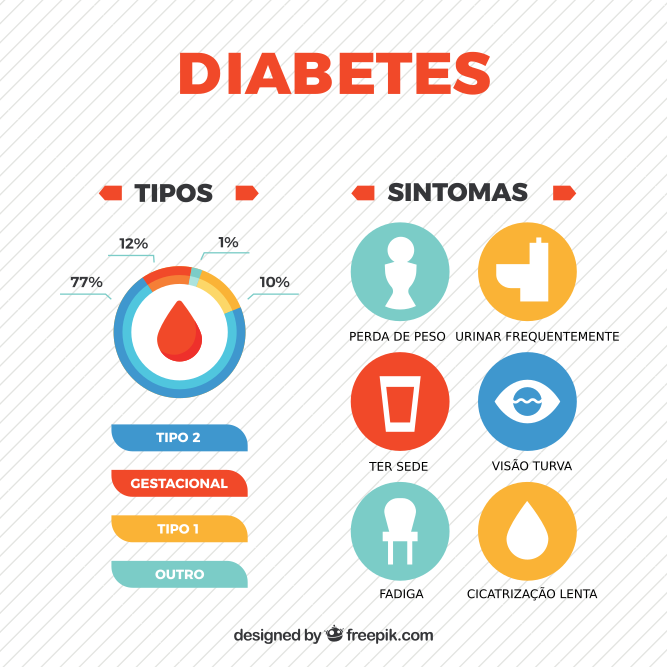

### Importando as bibliotecas

In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn import preprocessing
import category_encoders as ce

### Declarações de Funções

In [20]:
def listar_em_colunas(mylist, columns, sorted=False):
    def slice_list(mylist, cols):
        lines = [mylist[index:index+cols] for index in range(0, len(mylist), cols)]
        return lines

    str_list = mylist.copy()
    if len(str_list):
        if sorted:
            str_list.sort()
        max_len = max(len(text) for text in str_list)
        sliced_list = slice_list(str_list, columns)
        for row in sliced_list:
            print(''.join(text.ljust(max_len + 2) for text in row))
    else:
        print([])        


In [21]:
def carga_de_dados(data_source, sep):
    return pd.read_csv(data_source, sep=sep, encoding='utf-8')

In [22]:
def info_atributos(data):
    atributos_numericos =  data.select_dtypes(include=np.number).columns.values.tolist()
    atributos_categoricos = data.select_dtypes(include='object').columns.values.tolist()
    atributos_categoricos_pos = [data.columns.get_loc(coluna) for coluna in atributos_categoricos ]
    return atributos_numericos, atributos_categoricos, atributos_categoricos_pos

In [23]:
def normalizacao_atributos_numericos(data, atributos):
    dados_normalizados = data.copy()
    # StandardScaler
    scaler = preprocessing.StandardScaler().fit(dados_normalizados[atributos])
    dados_normalizados[atributos] = scaler.transform(dados_normalizados[atributos])
    return dados_normalizados    

In [24]:
def codificacao_atributos_categoricos(data, atributos):
    dados_codificados = data.copy()
    encoder = ce.OrdinalEncoder(cols=atributos, return_df = True)  
    dados_codificados = encoder.fit_transform(dados_codificados)
    return dados_codificados

In [25]:
def relatorio_de_nulos(data):
    quantidade_de_nulos = data.isnull().sum()
    percentual_de_nulos = (data.isnull().mean() * 100).round(3)
    nulos_df = pd.DataFrame({'Nulos': quantidade_de_nulos,
                             'Nulos(%)': percentual_de_nulos})
    nulos_df.sort_values(['Nulos(%)'], ascending=[False], inplace=True)
    nulos_df.head(len(nulos_df))
    return nulos_df


def mapa_de_valores_nulos(data):
    # Usando seaborn
    plt.figure(figsize=(10,15))
    ax = sns.heatmap(data.isnull(), cbar=False, cmap='viridis')
    ax.set_title('Mapa de valores Nulos')
    ax.set_ylabel('Indice Registro')
    ax.set_xlabel('Campo')
    plt.show()    


In [26]:
def mostra_percentual_nulos(nulos_df):
    # Usando pandas
    nulos_df['Nulos(%)'].plot(kind='barh', figsize=(15, 10), legend=True, fontsize=12)
    plt.title('Valores Nulos no Dataset')
    plt.ylabel('Atributo')
    plt.xlabel('Percentual de Nulos (%)')

In [27]:
def groupby_contagem(data, atributos):
    local_df = data.groupby(atributos).agg({atributos[1]: [('total', 'count')]}).reset_index()
    local_df.columns = atributos + ['total']
    #local_df.columns = local_df.columns.droplevel()
    return local_df

In [28]:
def plotagem_contagem(data, x, y, hue):
    # Usando Seaborn
    sns.set(rc={'figure.figsize':(15, 10)})
    sns.set(style='white')
    sns.barplot(x=x, 
                y=y, 
                hue=hue, 
                data=data)

In [29]:
def plotagem_matriz_confusao(data, atributos):
    # Usando matplotlib
    figsize = (15, 12)
    corr = data[atributos].corr()
    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(111)
    cax = ax.matshow(corr,cmap='coolwarm', vmin=-1, vmax=1)
    fig.colorbar(cax)
    ticks = np.arange(0,len(data[atributos].columns),1)
    ax.set_xticks(ticks)
    plt.xticks(rotation=90)
    ax.set_yticks(ticks)
    ax.set_xticklabels(data[atributos].columns)
    ax.set_yticklabels(data[atributos].columns)
    plt.show()

In [30]:
def plotagem_distribuicao_retornos(data, x, y, color):
    # Usando plotly.express
    fig = px.violin(data, 
                    y=y, 
                    x=x, 
                    color=color, 
                    box=True,
                    points="outliers",
                    hover_data=data.columns,
                    width=800,
                    height=800)
    fig.update_layout(title_text='Distribuição de Retorno de Pacientes', title_x=0.5)    
    fig.show()

In [31]:
def plotagem_distribuicao(data, x):
    # Usando plotly
    fig = px.histogram(data, 
                       x, 
                       template='none',
                       width=800,
                       height=400)
    fig.update_layout(title_text='Distribuição', title_x=0.5)    
    fig.show()

### Inicio EDA

In [35]:
DATA = 'diabetic_data.csv'

In [36]:
#Leitura do Dataset
df_diabetes = carga_de_dados(DATA, ',')
df_diabetes.head()

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,...,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,...,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,...,No,Steady,No,No,No,No,No,Ch,Yes,NO


In [37]:
#Informações do Dataset
df_diabetes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 50 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   encounter_id              101766 non-null  int64 
 1   patient_nbr               101766 non-null  int64 
 2   race                      101766 non-null  object
 3   gender                    101766 non-null  object
 4   age                       101766 non-null  object
 5   weight                    101766 non-null  object
 6   admission_type_id         101766 non-null  int64 
 7   discharge_disposition_id  101766 non-null  int64 
 8   admission_source_id       101766 non-null  int64 
 9   time_in_hospital          101766 non-null  int64 
 10  payer_code                101766 non-null  object
 11  medical_specialty         101766 non-null  object
 12  num_lab_procedures        101766 non-null  int64 
 13  num_procedures            101766 non-null  int64 
 14  num_

In [38]:
# Estatísticas do Dataset
df_diabetes.describe()

,encounter_id,patient_nbr,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
count,1.017660e+05,1.017660e+05,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000
mean,1.652016e+08,5.433040e+07,2.024006,3.715642,5.754437,4.395987,43.095641,1.339730,16.021844,0.369357,0.197836,0.635566,7.422607
std,1.026403e+08,3.869636e+07,1.445403,5.280166,4.064081,2.985108,19.674362,1.705807,8.127566,1.267265,0.930472,1.262863,1.933600
min,1.252200e+04,1.350000e+02,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000
25%,8.496119e+07,2.341322e+07,1.000000,1.000000,1.000000,2.000000,31.000000,0.000000,10.000000,0.000000,0.000000,0.000000,6.000000
50%,1.523890e+08,4.550514e+07,1.000000,1.000000,7.000000,4.000000,44.000000,1.000000,15.000000,0.000000,0.000000,0.000000,8.000000
75%,2.302709e+08,8.754595e+07,3.000000,4.000000,7.000000,6.000000,57.000000,2.000000,20.000000,0.000000,0.000000,1.000000,9.000000
max,4.438672e+08,1.895026e+08,8.000000,28.000000,25.000000,14.000000,132.000000,6.000000,81.000000,42.000000,76.000000,21.000000,16.000000


In [39]:
df_diabetes.median()

C:\Users\adrianars\AppData\Local\Temp\ipykernel_12232\1640640674.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_diabetes.median()


encounter_id                152388987.0
patient_nbr                  45505143.0
admission_type_id                   1.0
discharge_disposition_id            1.0
admission_source_id                 7.0
time_in_hospital                    4.0
num_lab_procedures                 44.0
num_procedures                      1.0
num_medications                    15.0
number_outpatient                   0.0
number_emergency                    0.0
number_inpatient                    0.0
number_diagnoses                    8.0
dtype: float64

#### Substituição dos valores '?' por NaN

In [40]:
df_diabetes = df_diabetes.replace('?', np.nan)

#### Identificando Pacientes Duplicados

In [41]:
por_indivduo_df = df_diabetes.drop_duplicates(subset=['patient_nbr'], keep='first').copy()
duplicados_df = df_diabetes[df_diabetes.duplicated('patient_nbr', keep=False)].sort_values('patient_nbr')
duplicados_df.head(6)

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
4780,26264286,135,Caucasian,Female,[50-60),NaN,1,1,7,3,...,No,No,No,No,No,No,No,Ch,Yes,>30
4267,24437208,135,Caucasian,Female,[50-60),NaN,2,1,1,8,...,No,Steady,No,No,No,No,No,Ch,Yes,<30
1164,8380170,1152,AfricanAmerican,Female,[50-60),NaN,1,1,7,6,...,No,Steady,No,No,No,No,No,No,Yes,>30
5953,30180318,1152,AfricanAmerican,Female,[50-60),NaN,1,1,7,6,...,No,Down,No,No,No,No,No,Ch,Yes,>30
23623,80742510,1152,AfricanAmerican,Female,[60-70),NaN,1,1,7,8,...,No,Steady,No,No,No,No,No,No,Yes,>30
14180,55533660,1152,AfricanAmerican,Female,[60-70),NaN,1,1,7,10,...,No,Steady,No,No,No,No,No,No,Yes,>30


#### Análise de Valores Nulos

In [42]:
nulos_df = relatorio_de_nulos(df_diabetes)
nulos_df = nulos_df[nulos_df['Nulos(%)'] > 0]
nulos_df.head(len(nulos_df.index))

,Nulos,Nulos(%)
weight,98569,96.858
medical_specialty,49949,49.082
payer_code,40256,39.557
race,2273,2.234
diag_3,1423,1.398
diag_2,358,0.352
diag_1,21,0.021


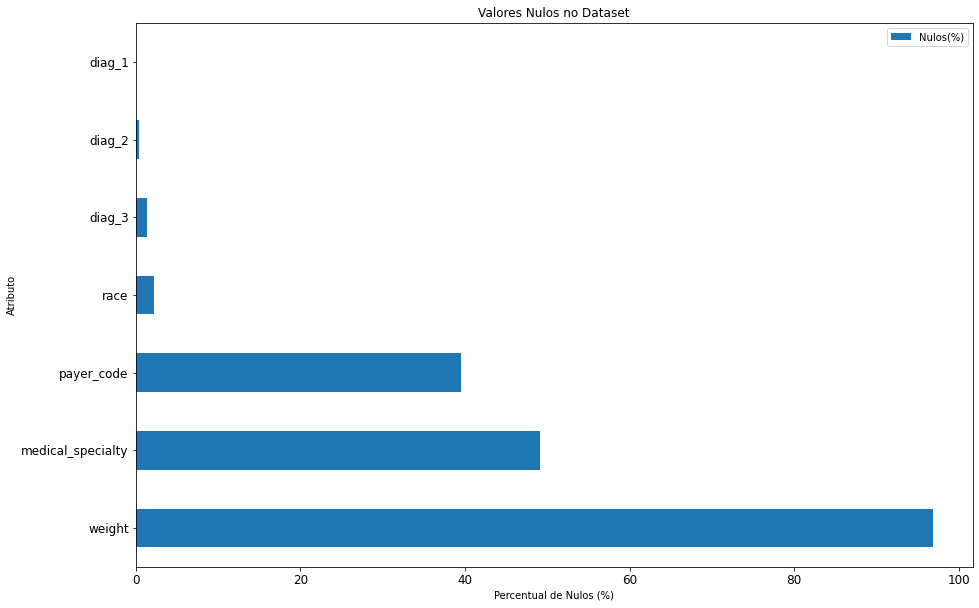

In [43]:
mostra_percentual_nulos(nulos_df)   

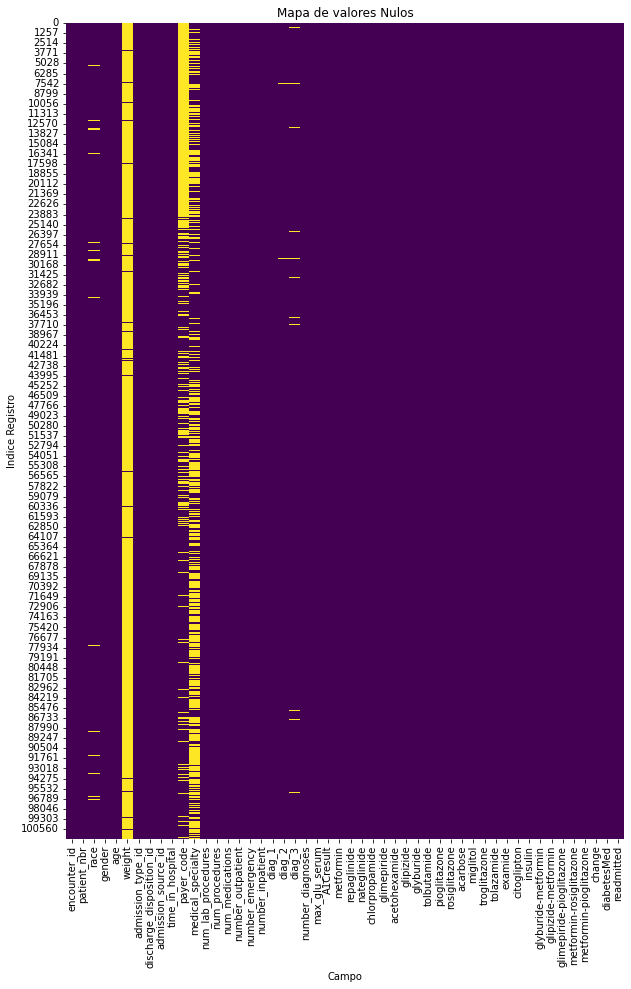

In [44]:
mapa_de_valores_nulos(df_diabetes)

#### Distribuiição das Variáveis (numéricas e string)

In [45]:
atributos_numericos, atributos_string, _ = info_atributos(df_diabetes)
print(f'Atributos Numéricos:')
listar_em_colunas(atributos_numericos, 3)
print('\n')
print(f'Atributos String:')
listar_em_colunas(atributos_string, 3)
print('\n')

Atributos Numéricos:
encounter_id              patient_nbr               admission_type_id         
discharge_disposition_id  admission_source_id       time_in_hospital          
num_lab_procedures        num_procedures            num_medications           
number_outpatient         number_emergency          number_inpatient          
number_diagnoses          


Atributos String:
race                      gender                    age                       
weight                    payer_code                medical_specialty         
diag_1                    diag_2                    diag_3                    
max_glu_serum             A1Cresult                 metformin                 
repaglinide               nateglinide               chlorpropamide            
glimepiride               acetohexamide             glipizide                 
glyburide                 tolbutamide               pioglitazone              
rosiglitazone             acarbose                  miglitol   

In [46]:
por_indivduo_df['race'].fillna('unknow', inplace=True)

In [47]:
por_indivduo_df['race'].unique().tolist()

['Caucasian', 'AfricanAmerican', 'unknow', 'Other', 'Asian', 'Hispanic']

In [48]:
plotagem_distribuicao(por_indivduo_df, 'race')   

### Verifique a distribuição da variável idade (age) - histograma

<AxesSubplot:xlabel='age', ylabel='count'>

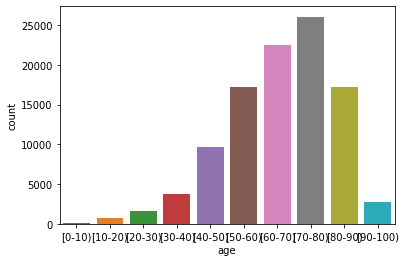

In [49]:
sns.countplot(x='age', data=df_diabetes)

#### Quantidade de Registros por Raça x Gênero

In [50]:
contagem_df = groupby_contagem(por_indivduo_df, ['race', 'gender'])
contagem_df.head(len(contagem_df.index))

,race,gender,total
0,AfricanAmerican,Female,7829
1,AfricanAmerican,Male,5058
2,Asian,Female,249
3,Asian,Male,248
4,Caucasian,Female,27565
5,Caucasian,Male,25926
6,Hispanic,Female,812
7,Hispanic,Male,705
8,Other,Female,589
9,Other,Male,588


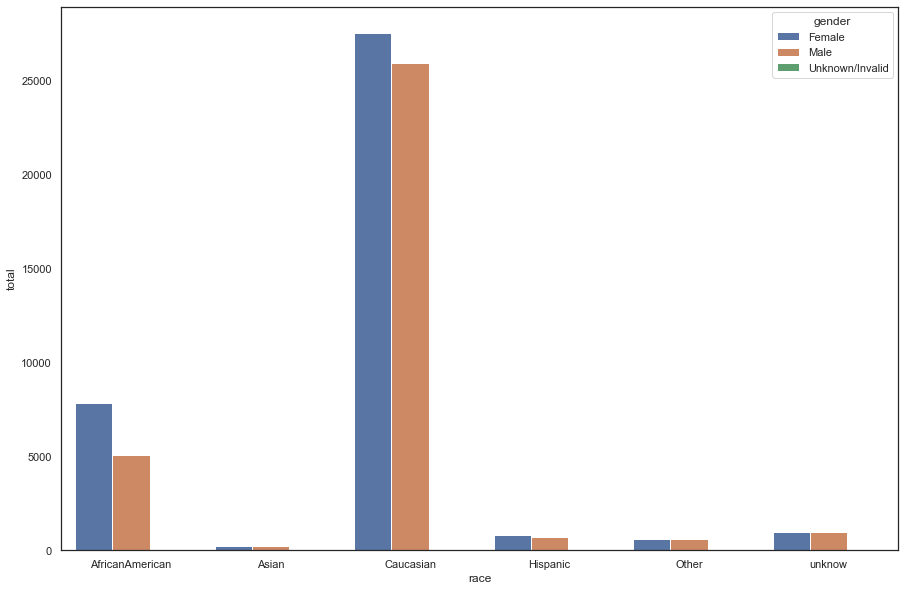

In [51]:
plotagem_contagem(data=contagem_df, x='race', y='total', hue='gender')  

#### Distribuição por Gênero

In [52]:
patient_distinct_g = df_diabetes[['patient_nbr', 'gender']].drop_duplicates()

df_bar_g = patient_distinct_g.pivot_table(index='gender', values='patient_nbr', aggfunc='count').sort_values(by="patient_nbr", ascending=False)

fig = px.bar(df_bar_g)
fig.update_layout(
    xaxis_title="Gênero",
    yaxis_title="Quantidade de pessoas",
    title={
        'text': 'Distribuição de pessoas por gênero',
        'y':0.95,
        'x':0.5,
        'font_color': 'grey'
    })
fig.update_layout(showlegend=False)
fig.show()
#df["race"].value_counts()

#### Distribuição de Registros por Raça x Idade

In [53]:
contagem_df = groupby_contagem(por_indivduo_df, ['race', 'age'])
contagem_df.head(len(contagem_df.index))

,race,age,total
0,AfricanAmerican,[0-10),16
1,AfricanAmerican,[10-20),155
2,AfricanAmerican,[20-30),373
3,AfricanAmerican,[30-40),835
4,AfricanAmerican,[40-50),1874
5,AfricanAmerican,[50-60),2903
6,AfricanAmerican,[60-70),2827
7,AfricanAmerican,[70-80),2491
8,AfricanAmerican,[80-90),1176
9,AfricanAmerican,[90-100),237


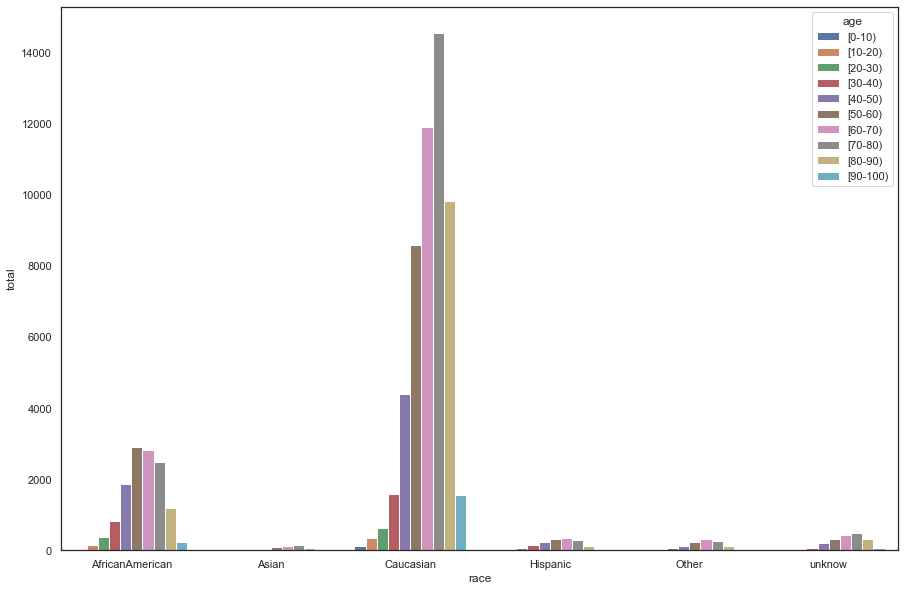

In [54]:
plotagem_contagem(data=contagem_df, x='race', y='total', hue='age')   

### Verifique se há outliers nas variáveis 


<AxesSubplot:xlabel='number_diagnoses', ylabel='age'>

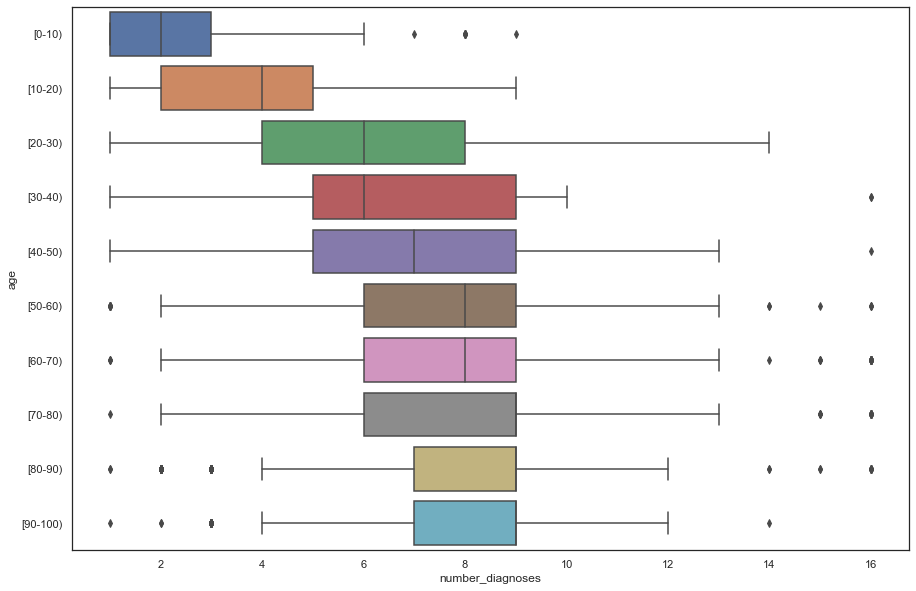

In [55]:
sns.boxplot(x='number_diagnoses', y='age', data=df_diabetes)

#### Distribuição de Registros por Idade x Gênero

In [56]:
contagem_df = groupby_contagem(por_indivduo_df, ['age', 'gender'])
contagem_df.head(len(contagem_df.index))

,age,gender,total
0,[0-10),Female,81
1,[0-10),Male,73
2,[10-20),Female,301
3,[10-20),Male,234
4,[20-30),Female,730
5,[20-30),Male,397
6,[30-40),Female,1563
7,[30-40),Male,1136
8,[40-50),Female,3371
9,[40-50),Male,3507


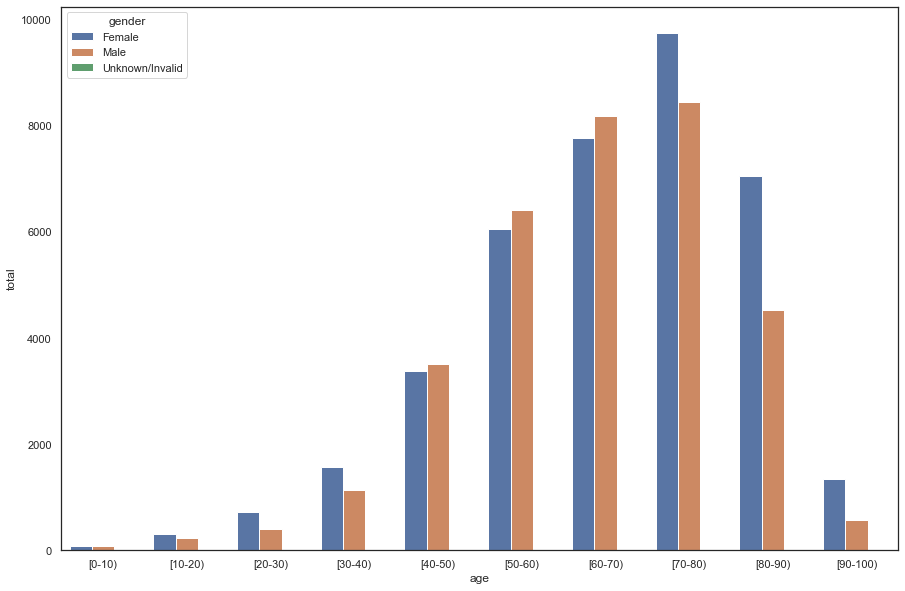

In [57]:
plotagem_contagem(x='age', y='total', hue='gender', data=contagem_df)   

### Gráfico de Dispersão dada a Idade, Número de Diagnósticos e Tempo no Hospital

In [58]:
#gráfico de dispersão dada a idade, número de diagnose e tempo no hospital
df_age = df_diabetes.pivot_table(index = ['number_diagnoses','age'], values = 'time_in_hospital', aggfunc = 'mean').reset_index()
df_age.head()
px.scatter(data_frame=df_age, x='time_in_hospital', y='number_diagnoses', color='age')

C:\Users\adrianars\Anaconda3\envs\ds_boti\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



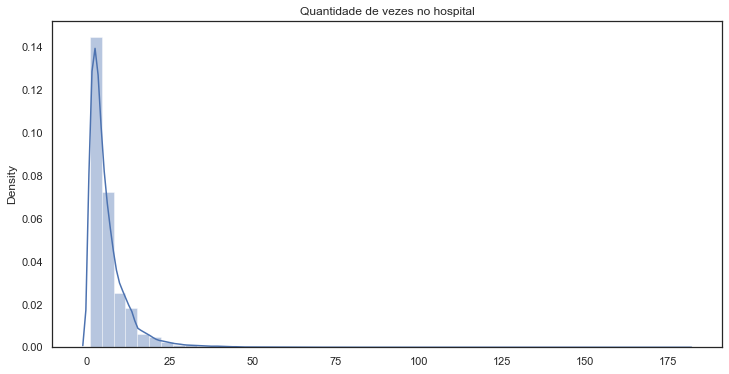

In [59]:
#df["patient_nbr"].unique().value_counts()
df_time_hosp = df_diabetes.pivot_table(index='patient_nbr', values='time_in_hospital', aggfunc='sum')

plt.figure(figsize=(12,6))
ax = sns.distplot(x=df_time_hosp['time_in_hospital'])
ax.set_title('Quantidade de vezes no hospital');

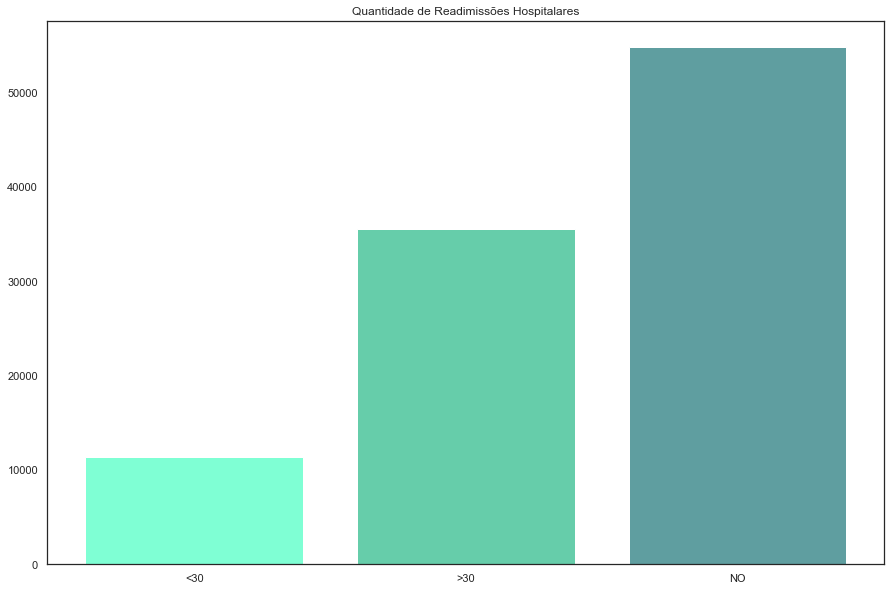

In [60]:
df_bar_readmitted = df_diabetes.pivot_table(index='readmitted', values='encounter_id', aggfunc='count')
df_bar_readmitted

ax = plt.bar(df_bar_readmitted.index, df_bar_readmitted['encounter_id'], color=['#7FFFD4', '#66CDAA', '#5F9EA0'])
plt.title('Quantidade de Readimissões Hospitalares');

Text(0, 0.5, '% Readimissões')

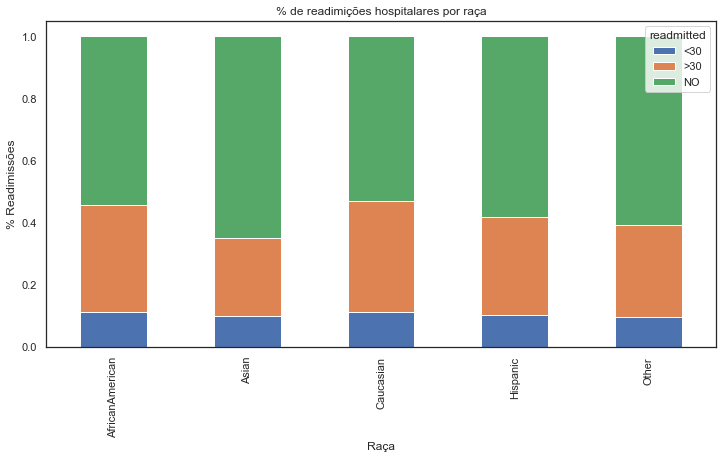

In [61]:
#plt.figure(figsize=(12,6))
df_stacked = df_diabetes.groupby('race')['readmitted'].value_counts(normalize=True).unstack('readmitted')

df_stacked.plot(kind="bar", stacked=True, figsize=(12,6))
plt.title("% de readimições hospitalares por raça")
plt.xlabel("Raça")
plt.ylabel("% Readimissões")

In [62]:
contagem_df = groupby_contagem(duplicados_df, ['patient_nbr', 'gender', 'race', 'age'])
contagem_df.head(len(contagem_df.index))

,patient_nbr,gender,race,age,total
0,135,Female,Caucasian,[50-60),2
1,1152,Female,AfricanAmerican,[50-60),2
2,1152,Female,AfricanAmerican,[60-70),3
3,1314,Female,Caucasian,[40-50),3
4,5220,Male,Caucasian,[60-70),1
...,...,...,...,...,...
18243,188238020,Female,Caucasian,[80-90),2
18244,188284883,Female,Other,[80-90),2
18245,188634893,Male,Caucasian,[70-80),2
18246,188970179,Female,Asian,[70-80),2


In [63]:
plotagem_distribuicao_retornos(contagem_df, x="race", y='total', color='gender')

In [64]:
plotagem_distribuicao_retornos(contagem_df, x="age", y='total', color='gender')

#### Correlação

In [65]:
normalizado_df = codificacao_atributos_categoricos(df_diabetes, atributos_string)

In [66]:
normalizado_df = normalizacao_atributos_numericos(normalizado_df, normalizado_df.columns.to_list())

In [67]:
normalizado_df.head(10)

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,-1.587330,-1.191545,-0.437238,-0.927397,-3.824600,-0.147575,2.750800,4.031022,-1.169873,-1.137649,...,0.0,-0.966607,-0.081566,-0.011303,-0.003135,-0.004433,-0.003135,-0.926591,-1.829868,-0.83688
1,-1.608075,0.033564,-0.437238,-0.927397,-3.197277,-0.147575,-0.708461,-0.514312,0.306482,-0.467653,...,0.0,-0.069648,-0.081566,-0.011303,-0.003135,-0.004433,-0.003135,1.079225,0.546488,0.62497
2,-1.608901,0.819654,0.647420,-0.927397,-2.569954,-0.147575,-0.708461,-0.514312,0.306482,-0.802651,...,0.0,-0.966607,-0.081566,-0.011303,-0.003135,-0.004433,-0.003135,-0.926591,0.546488,-0.83688
3,-1.604653,0.726480,-0.437238,1.078031,-1.942632,-0.147575,-0.708461,-0.514312,0.306482,-0.802651,...,0.0,-0.069648,-0.081566,-0.011303,-0.003135,-0.004433,-0.003135,1.079225,0.546488,-0.83688
4,-1.609366,-0.305227,-0.437238,1.078031,-1.315309,-0.147575,-0.708461,-0.514312,0.306482,-1.137649,...,0.0,0.827311,-0.081566,-0.011303,-0.003135,-0.004433,-0.003135,1.079225,0.546488,-0.83688
5,-1.609180,0.731521,-0.437238,1.078031,-0.687986,-0.147575,-0.016609,-0.514312,-0.923814,-0.467653,...,0.0,0.827311,-0.081566,-0.011303,-0.003135,-0.004433,-0.003135,-0.926591,0.546488,0.62497
6,-1.608984,0.773446,-0.437238,1.078031,-0.060664,-0.147575,0.675243,-0.514312,-0.923814,-0.132655,...,0.0,0.827311,-0.081566,-0.011303,-0.003135,-0.004433,-0.003135,1.079225,0.546488,-0.83688
7,-1.608907,1.564821,-0.437238,1.078031,0.566659,-0.147575,-0.708461,-0.514312,0.306482,0.202343,...,0.0,-0.966607,-0.081566,-0.011303,-0.003135,-0.004433,-0.003135,-0.926591,0.546488,0.62497
8,-1.609406,-0.155044,-0.437238,-0.927397,1.193982,-0.147575,-0.016609,-0.514312,-0.431695,2.882327,...,0.0,0.827311,-0.081566,-0.011303,-0.003135,-0.004433,-0.003135,1.079225,0.546488,-0.83688
9,-1.609375,0.238410,-0.437238,-0.927397,1.821305,-0.147575,0.675243,-0.135535,-0.431695,2.547329,...,0.0,0.827311,-0.081566,-0.011303,-0.003135,-0.004433,-0.003135,1.079225,0.546488,-0.83688


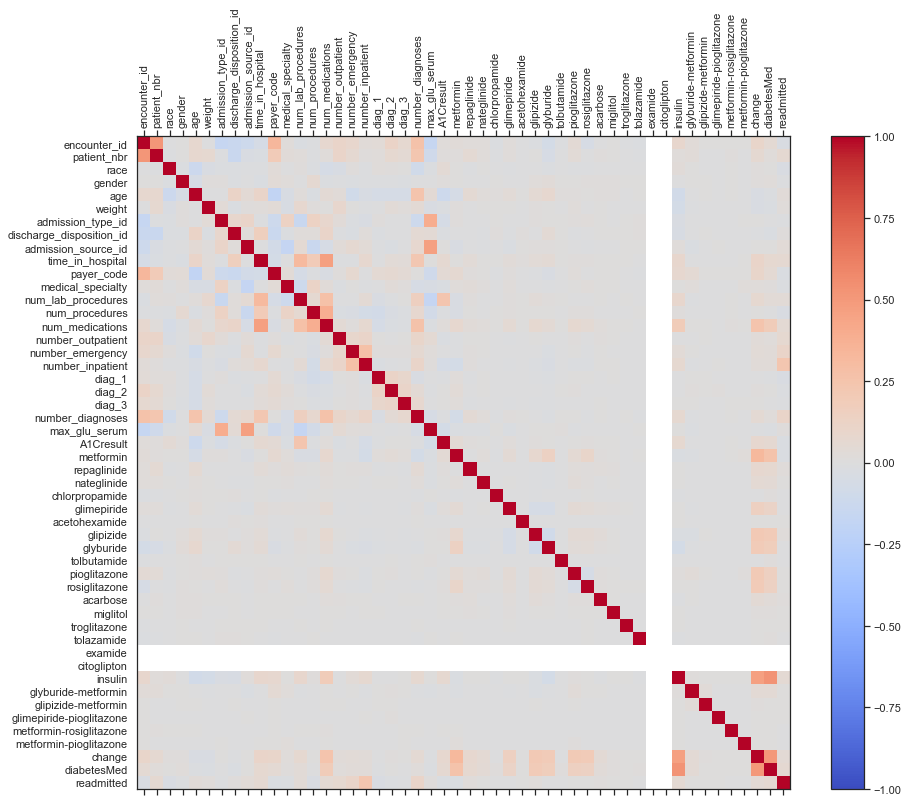

In [68]:
plotagem_matriz_confusao(normalizado_df, normalizado_df.columns.to_list())